# 第4章 正则表达式与格式化输出
正则表达式（Regular Expression）描述了一种字符串匹配的模式（Pattern），可以用来检查一个字符串是否含有某种子串、将匹配的子串替代或者从某个字符串中去除符合某个条件的子串等。  

为了让输出显示更符合要求，需要对输出进行控制——格式化输出。

In [4]:
import re
input_str = "我的邮箱是：315680524@qq.com"
print(re.search(r'\d{5,10}@qq\.com', input_str))

<re.Match object; span=(6, 22), match='315680524@qq.com'>


## 4.1 正则表达式基础

正则表达式参考资料：https://www.runoob.com/python/python-reg-expressions.html

正则表达式又称正规表示式、规则表达式、常规表示法等，在代码中常简写为regex、regexp或RE，是计算机科学的一个概念。在很多文本编辑器里，正则表达式通常被用来检索、替换那些匹配某个模式的文本。  

许多程序设计语言都支持利用正则表达式对字符串操作。正则表达式这个概念最初是由UNIX中的工具软件（如sed和grep）普及开的。  

正则表达式对与Python来说不是独有的。Python中正则表达式的模块通常叫作“re”，利用“import re”来引入，它是一种用来匹配字符串的工具。其设计思想是用一种描述性的语言来给字符串定义一个规则，凡是符合规则的字符串，就任务它“匹配”了，否则，该字符串就是不符合规则的，就是不匹配。

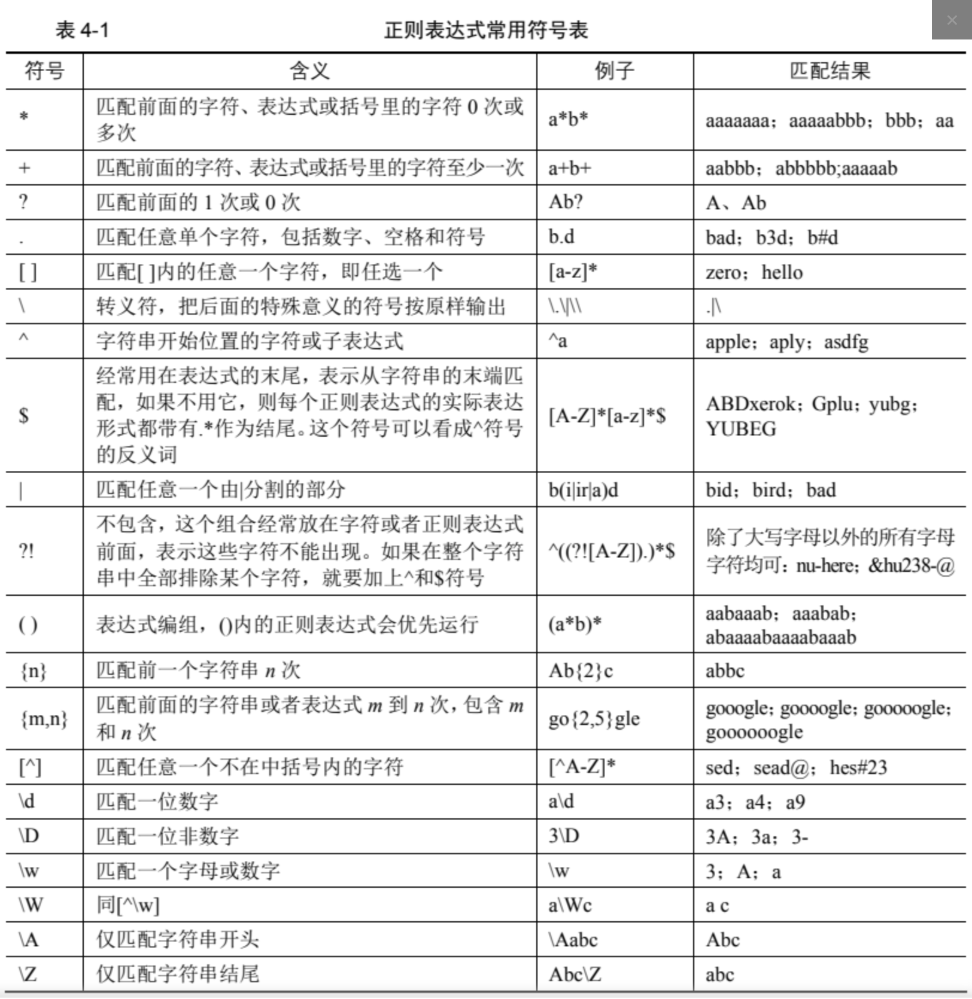

In [3]:
# 电话号码匹配，判断是否为一个电话号码
import re
s = '010-12345678'
print(re.match(r'^\d{3}\-\d{8}$', s))  # match()方法从字符串的起始位置匹配正则表达式，如果不是起始位置匹配成功的话，match()就返回none

<re.Match object; span=(0, 12), match='010-12345678'>


## 4.2 re模块
Python提供re模块，其包含所有正则表达式的功能。由于Python的字符串本身也用\转义所以要特别注意。

In [ ]:
s = 'ABC\\-001'  # Python的字符串

对应的正则表达式字符串变成：
```
'ABC\-001'
```
因此强烈建议使用Python的r做前缀，这样就不用考虑转义的问题了

In [ ]:
s = r'ABC\-001'  # Python的字符串

对应的正则表达式字符串不变：
```
'ABC\-001'
```

### 4.2.1 判断匹配
先看看如何判断正则表达式是否匹配。

In [1]:
import re

In [7]:
print(re.match(r'^\d{3}\-\d{3,8}$', '010-12345'))

<re.Match object; span=(0, 9), match='010-12345'>


In [8]:
print(re.match(r'^\d{3}\-\d{3,8}$', '010 12345'))

None


re.match尝试从字符串的起始位置匹配一个模式，如果不是起始位置匹配，match()函数返回None。  
re.match(pattern, string)  
函数参数说明如下。
- pattern：匹配的正则表达式。
- string：要匹配的字符串。

In [10]:
print(re.match(r'How', 'How are you'))

<re.Match object; span=(0, 3), match='How'>


In [9]:
print(re.match(r'How', 'How are you').span())  # 在起始位置匹配，输出结果为(0, 3)

(0, 3)


In [11]:
print(re.match(r'are', 'How are you'))  # 不在起始位置匹配，输出结果为None

None


match()函数判断是否匹配，如果匹配成功，返回一个Match对象，否则返回None。

### 4.2.2 切分字符串
用正则表达式切分字符串比用固定的字符更灵活

In [14]:
'a b   c'.split(' ')

['a', 'b', '', '', 'c']

执行上面的代码结果显示，无法识别连续的空格。

In [ ]:
re.split(r'\s+', 'a b   c')  # \s表示匹配任意的空白字符，+表示匹配一次或多次

['a', 'b', 'c']

In [ ]:
re.split(r'[\s\,]+', 'a,b, c  d')  # []表示匹配方括号内的任意一个字符，\s表示空白，\,表示逗号，+表示匹配一次或多次

['a', 'b', 'c', 'd']

In [17]:
re.split(r'[\s\,\;]+', 'a,b;; c  d')  # 多个分隔符

['a', 'b', 'c', 'd']

如果用户输入一组标签，可以用正则表达式把不规范的输入转化成正确的数组。

### 4.2.3 分组
除了简单地判断是否匹配之外，正则表达式还有提取子串的强大功能。用()表示的即为要提取的分组（Group）。

从匹配的字符串中提取出区号和本地号码

In [18]:
m = re.match(r'^(\d{3})-(\d{3,8})$', '010-12345')
m

<re.Match object; span=(0, 9), match='010-12345'>

In [ ]:
m.group(0)  # 匹配到的字符串

'010-12345'

In [20]:
m.group(1)  # 第一个分组

'010'

In [21]:
m.group(2)  # 第二个分组

'12345'

如果正则表达式中定义了组，就可以在match对象上用group()方法提取出子串。注意到group(0)是原始字符串，group(1)、group(2)……表示第1、2、……个子串。提取子串非常有用

In [22]:
t = '19:05:30'
m = re.match(r'^(0[0-9]|1[0-9]|2[0-3]|[0-9])\:(0[0-9]|1[0-9]|2[0-9]|3[0-9]|4[0-9]|5[0-9]|[0-9])\:(0[0-9]|1[0-9]|2[0-9]|3[0-9]|4[0-9]|5[0-9]|[0-9])$', t)
m.groups()

('19', '05', '30')

这个正则表达式可以直接识别合法的时间。但有些时候，用正则表达式也无法做到完全验证，识别日期代码如下：  
'^(0[0-9]|1[0-9]|2[0-3]|[0-9])\:(0[0-9]|1[0-9]|2[0-9]|3[0-9]|4[0-9]|5[0-9]|[0-9])\:(0[0-9]|1[0-9]|2[0-9]|3[0-9]|4[0-9]|5[0-9]|[0-9])$'  
对于'2-30"4-31'这样的非法日期，用正则还是识别不了，或者说写出来非常困难，这时就需要程序配合识别了。

## 4.3 贪婪匹配
需要特别指出的是正则匹配默认是贪婪匹配，也就是匹配尽可能可能多的字符

In [23]:
re.match(r'^(\d+)(0*)$', '102300').groups()

('102300', '')

由于\d+采用贪婪匹配，直接把后面的0全部匹配了，结果0*只能匹配空字符串了。  
必须让\d+采用非贪婪匹配（也就是尽可能少地匹配），才能把后面的0匹配出来，加个?就可以让\d+采用非贪婪匹配

In [25]:
re.match(r'^(\d+?)(0*)$', '102300').groups()

('1023', '00')

## 4.4 编译
在Python中使用正则表达式时，re模块内部会做两件事情。
- 编译正则表达式，如果正则表达式的字符串本身不合法，会报错；
- 用编译后的正则表达式去匹配字符串。

如果一个正则表达式要重复使用几千次，出于效率的考虑，我们可以预编译该正则表达式，接下来重复使用时就不需要编译这个步骤了，直接匹配。

In [26]:
import re

In [27]:
re_telephone = re.compile(r'^(\d{3})-(\d{3,8})$')  # 编译

In [28]:
re_telephone.match('010-12345').groups()  # 使用

('010', '12345')

In [29]:
re_telephone.match('010-8086').groups()

('010', '8086')

编译后生成Regular Expression对象，由于该对象自己包含了正则表达式，所以调用对应的方法时不用给出正则字符串。

## 4.5 正则函数
在Python中，re模块提供了几个函数对输入的字符串进行确切的查询，具体如下：
- re.compile()
- re.match()
- re.search()
- re.findall()  

每个函数都接受一个正则表达式和一个待查找匹配的字符串。

### 4.5.1 re.compile()
re.compile()函数用于编译正则表达式，返回一个对象。可以把常用的正则表达式编译成正则表达式对象，方便后续调用及提高效率。
```
re.compile(pattern, flags=0)
```
pattern：指定编译时的表达式字符串。
flags：编译标志位，用来修改正则表达式的匹配方式。支持re.L|re.M同时匹配flags标志位参数。
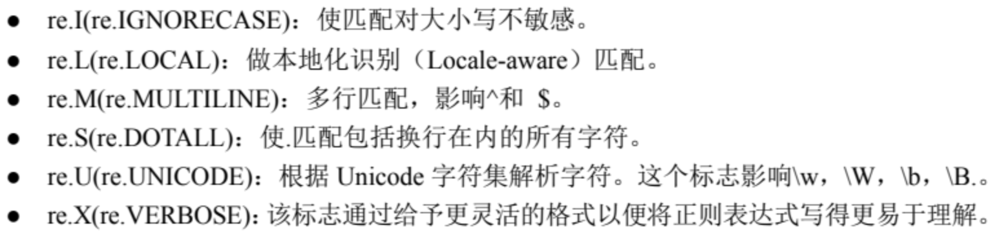

In [30]:
import re
content = 'Citizen wang, always fall in love with neighbour, WANG'
rr = re.compile(r'wan\w', re.I)  # 不区分大小写
print(type(rr))

<class 're.Pattern'>


In [32]:
a = rr.findall(content)
print(type(a))
print(a)

<class 'list'>
['wang', 'WANG']


### 4.5.2 re.match()函数
re.match()函数总是从字符串“开头匹配”，并返回匹配的字符串的match对象。
```
re.match(pattern, string, flags=0)
```
pattern：匹配模式，由re.compile获得。
string：需要匹配的字符串。  

re.match()函数的工作方式是只有当被搜索字符串的开头匹配模式的时候，它才能查找到匹配对象

查找模式匹配'dog'

In [33]:
import re
re.match(r'dog', 'dog rat dog')

<re.Match object; span=(0, 3), match='dog'>

In [34]:
m1 = re.match(r'dog', 'dog rat dog')
m1.group()

'dog'

对'rat'查找，则不会找到匹配

In [35]:
re.match(r'rat', 'dog rat dog')

In [36]:
import re
pattern = re.compile(r'hello')
a = re.match(pattern, 'hello world')
b = re.match(pattern, 'world hello')
c = re.match(pattern, 'hell')
d = re.match(pattern, 'hello')
if a:
    print(a.group())
else:
    print('a失败')
if b:
    print(b.group())
else:
    print('b失败')
if c:
    print(c.group())
else:
    print('c失败')
if d:
    print(d.group())
else:
    print('d失败')

hello
b失败
c失败
hello


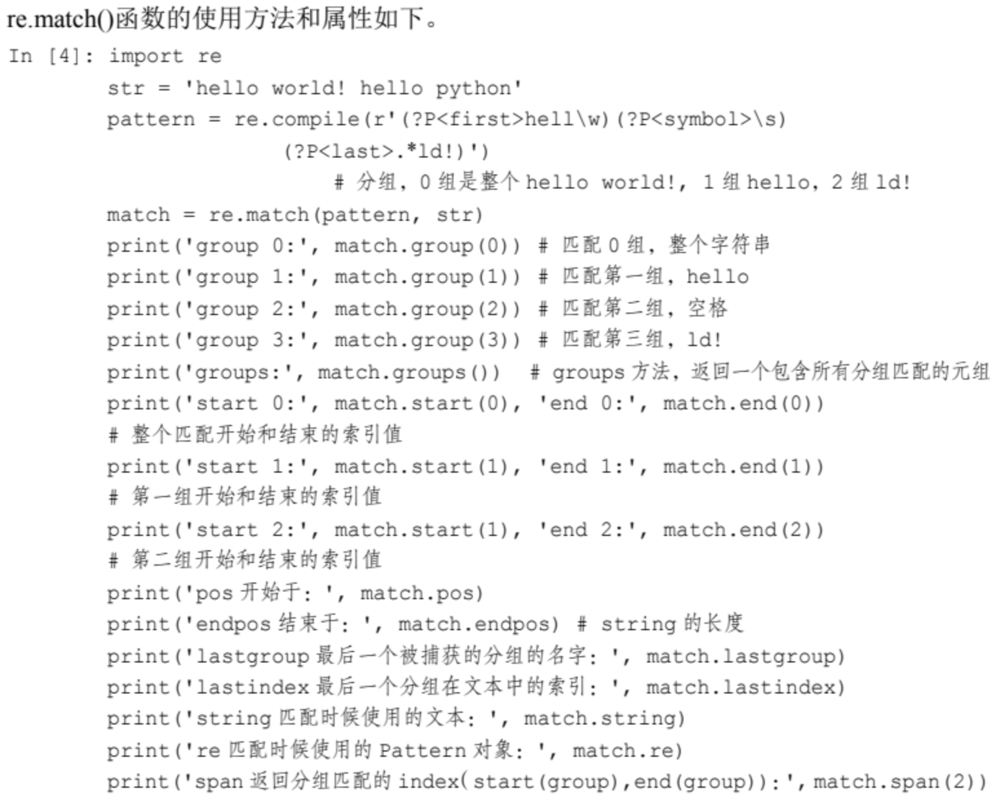

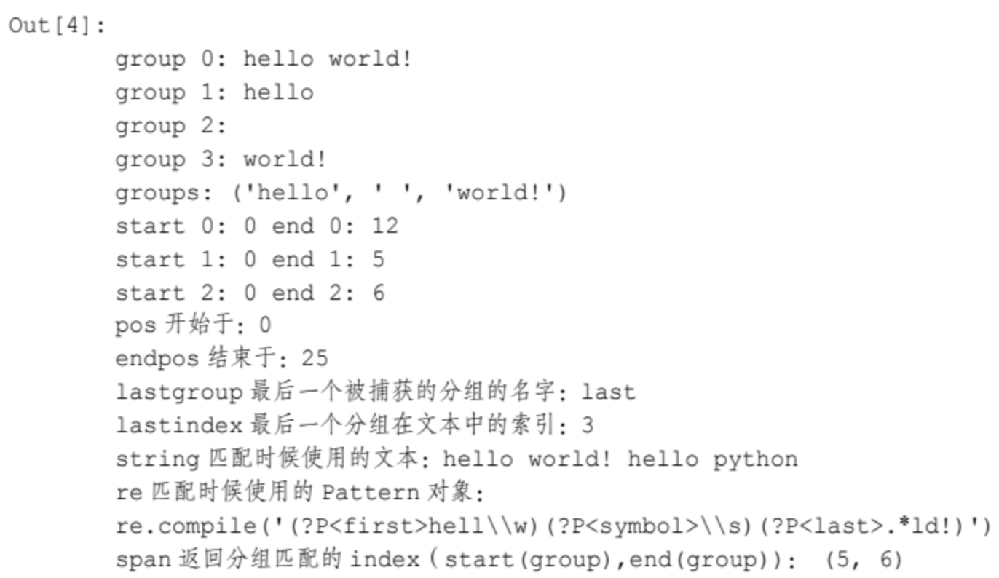

### 4.5.3 re.search()函数
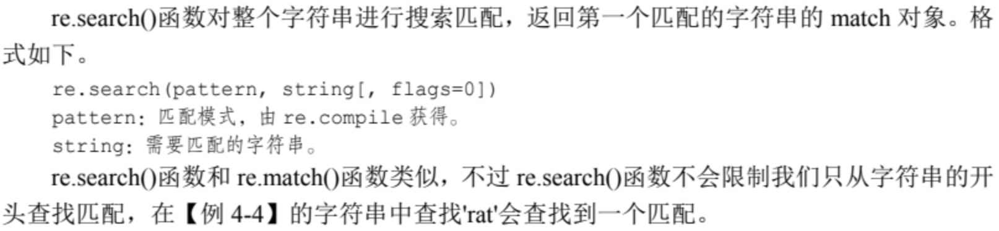

In [38]:
m21 = re.search(r'rat', 'dog rat dog')
m21.group(0)

'rat'

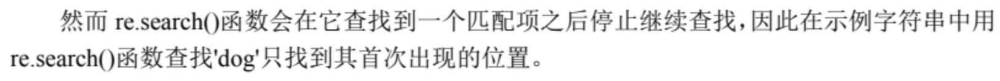

In [39]:
m22 = re.search(r'dog', 'dog rat dog')
m22.group(0)

'dog'

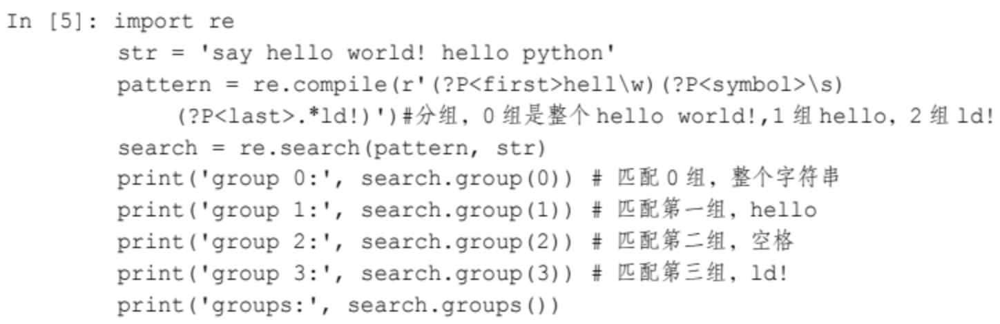

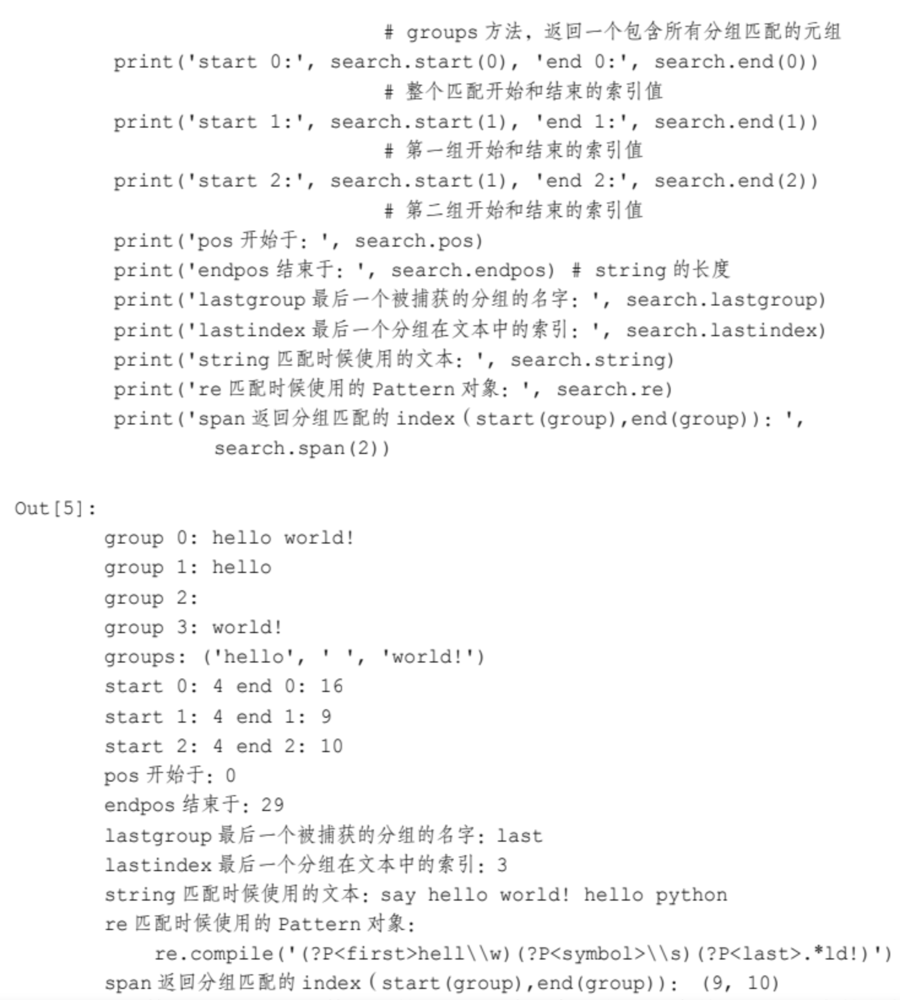

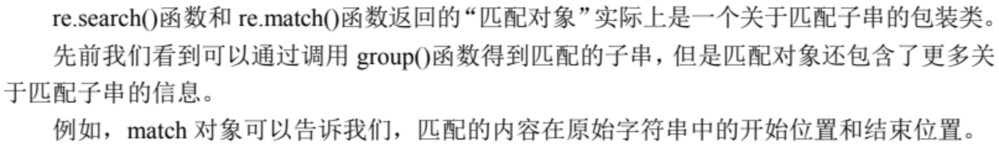

In [40]:
m0 = re.search(r'dog', 'dog rat dog')
m0.start()

0

In [41]:
m0.end()

3

### 4.5.4 re.findall()函数
在Python中使用最多的查找方法是调用re.findall()函数。调用re.findall()函数时可以非常简单地得到一个所有匹配模式的列表，而不是得到match的对象。

In [42]:
re.findall(r'dog', 'dog rat dog')

['dog', 'dog']

In [43]:
re.findall(r'rat', 'dog rat dog', re.I)

['rat']

### 4.5.5 字符串的替换和修改
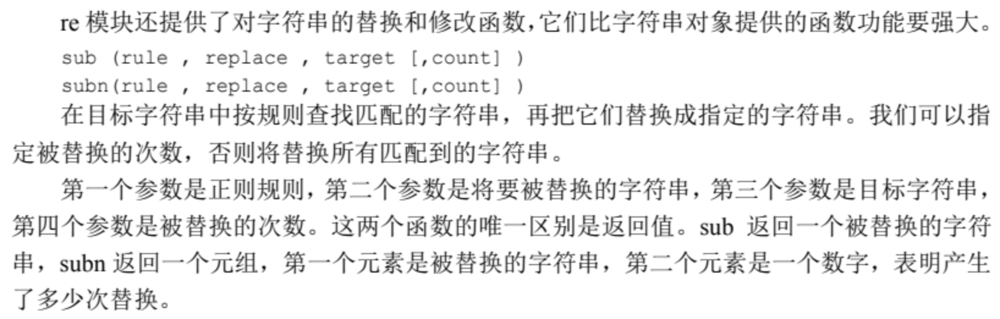

将字符串中的dog全部替换成cat

In [44]:
s = 'I have a dog, you have a dog, he have a dog'
re.sub(r'dog', 'cat', s)

'I have a cat, you have a cat, he have a cat'

只替换前面两个dog

In [45]:
re.sub(r'dog', 'cat', s, 2)

'I have a cat, you have a cat, he have a dog'

想要知道发生了多少次替换，可以使用subn

In [46]:
re.subn(r'dog', 'cat', s)

('I have a cat, you have a cat, he have a cat', 3)

## 4.6 格式化输出
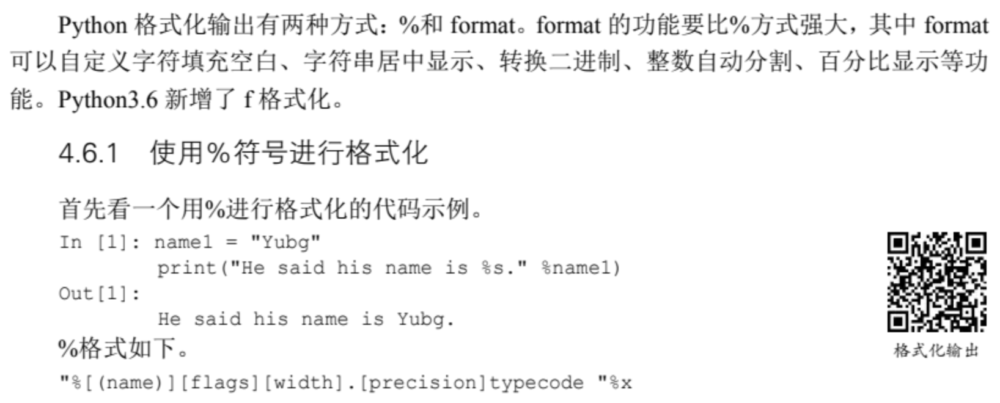

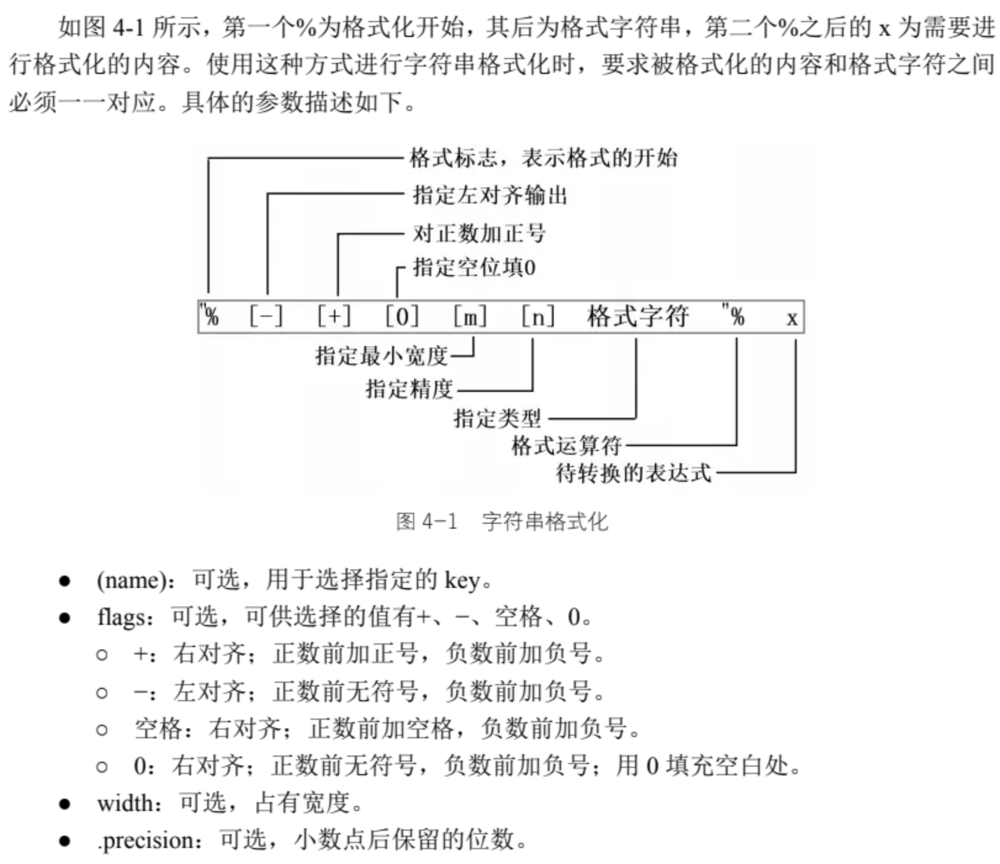

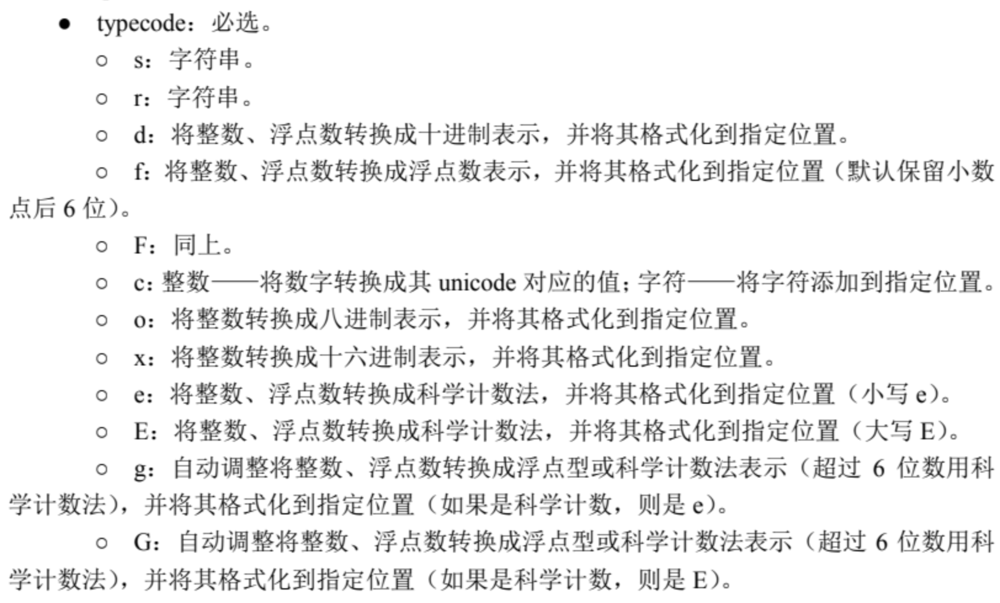

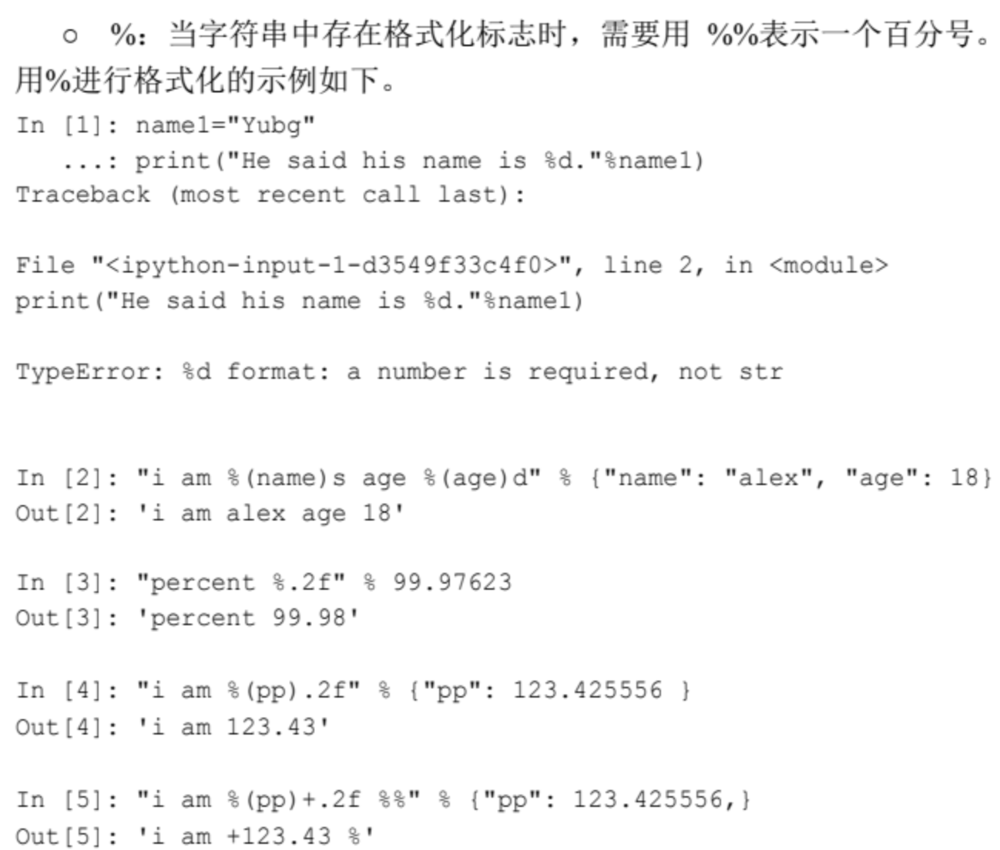

### 4.6.2 使用format()函数进行格式化
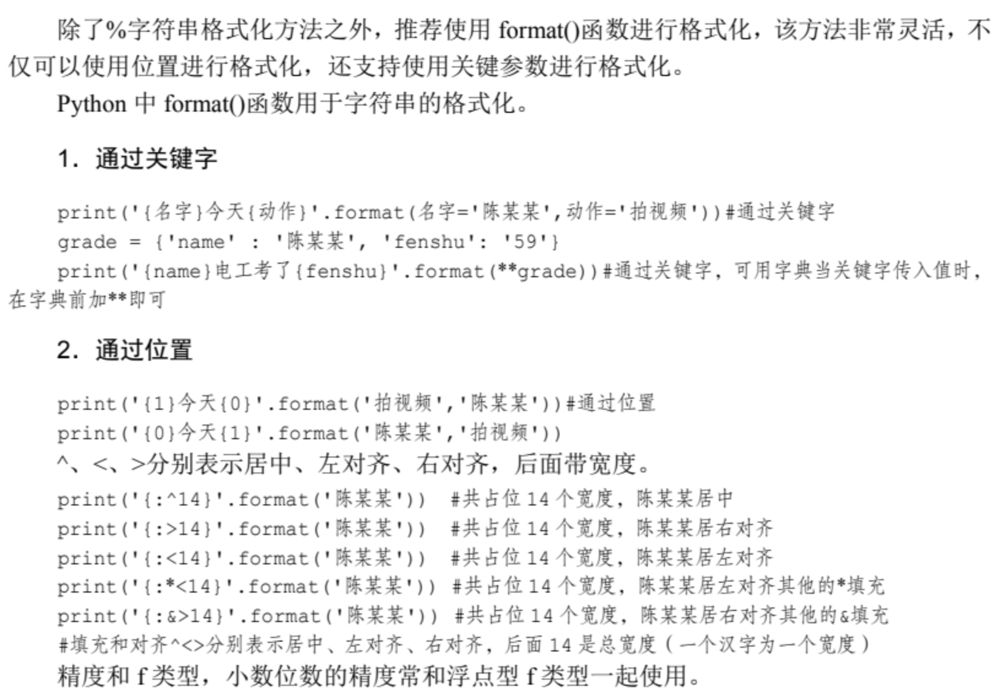

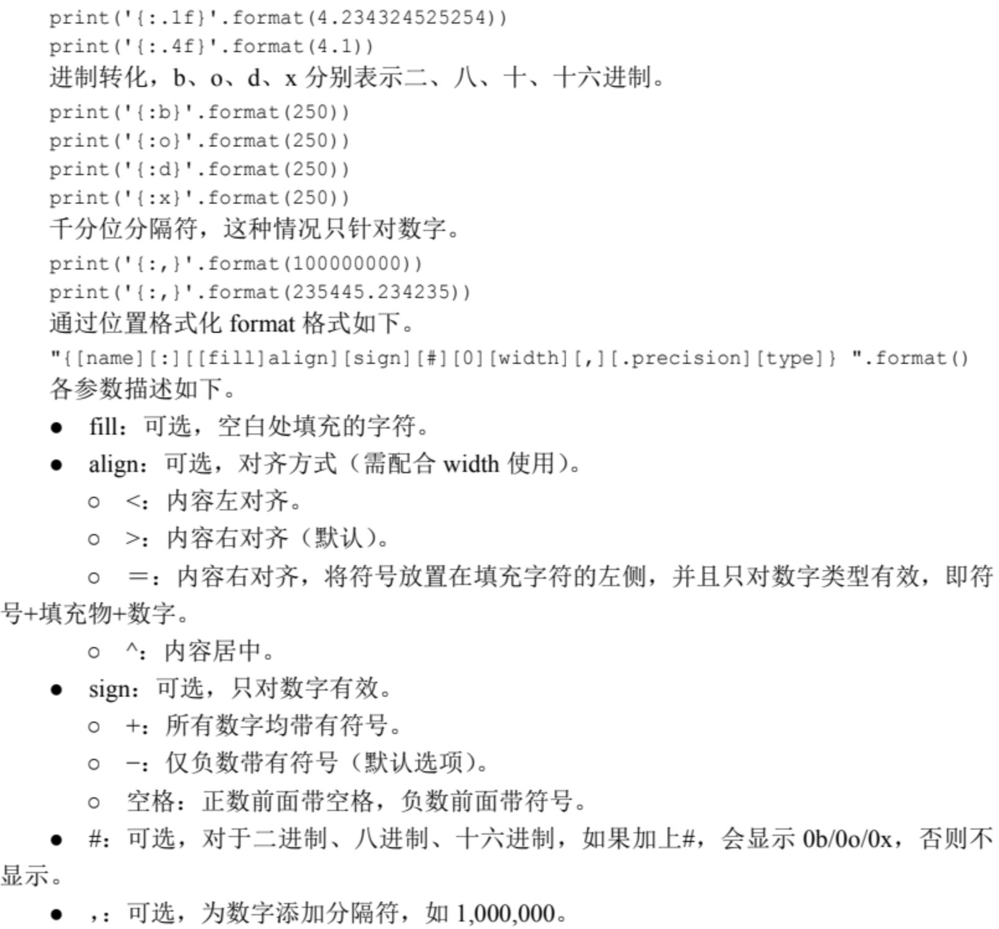

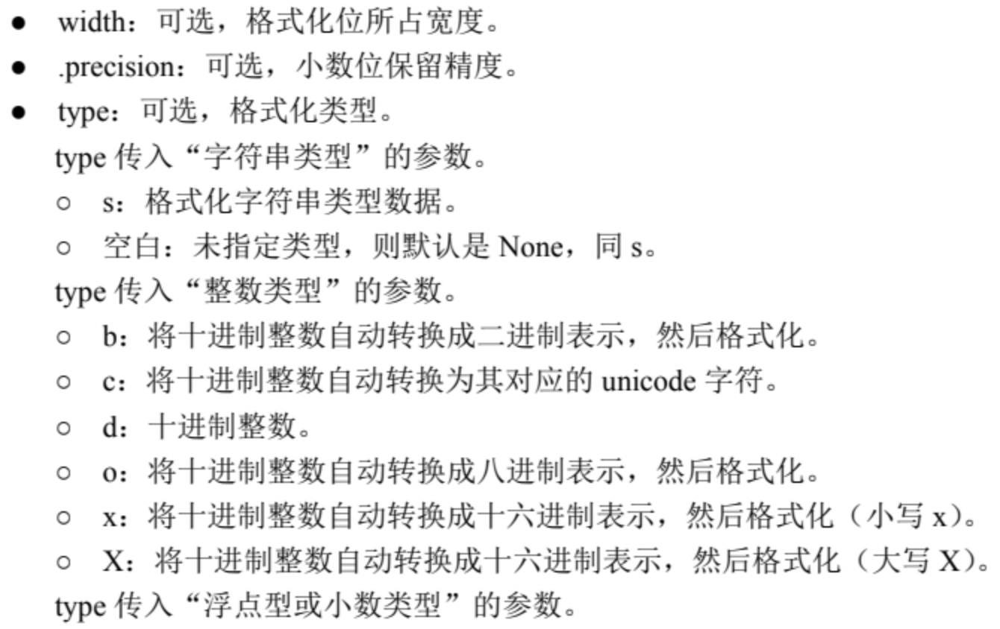

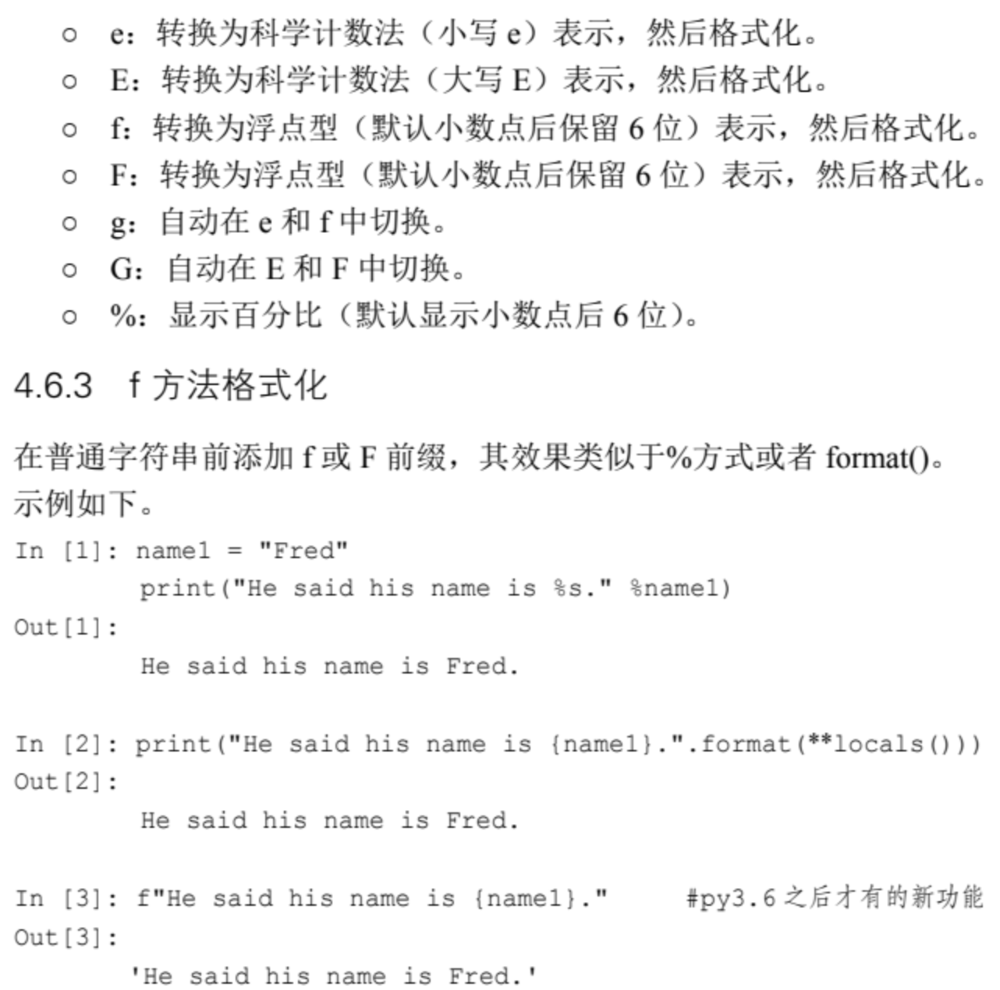

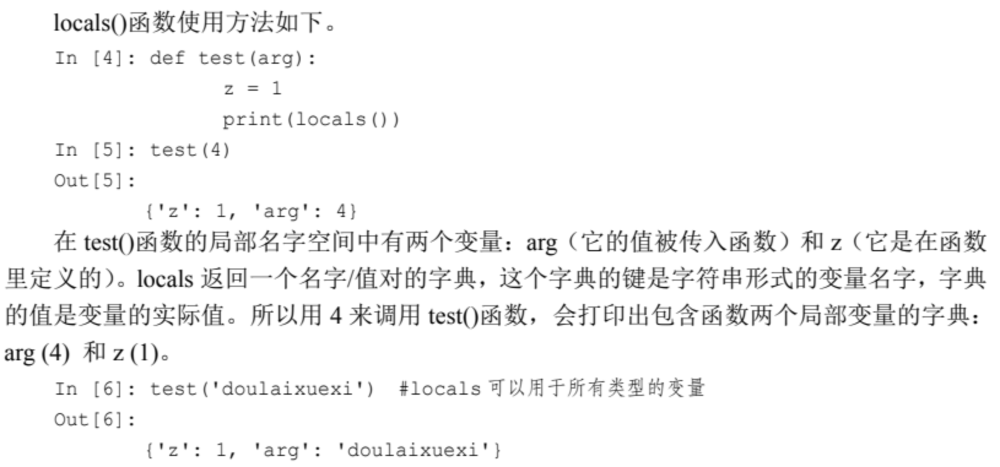

## 4.7 实战体验：验证信息的正则表达式
在填写个人信息时，对有些信息需要进行验证，如手机号、身份证、E-mail等。下面对从键盘输入的E-mail进行验证。
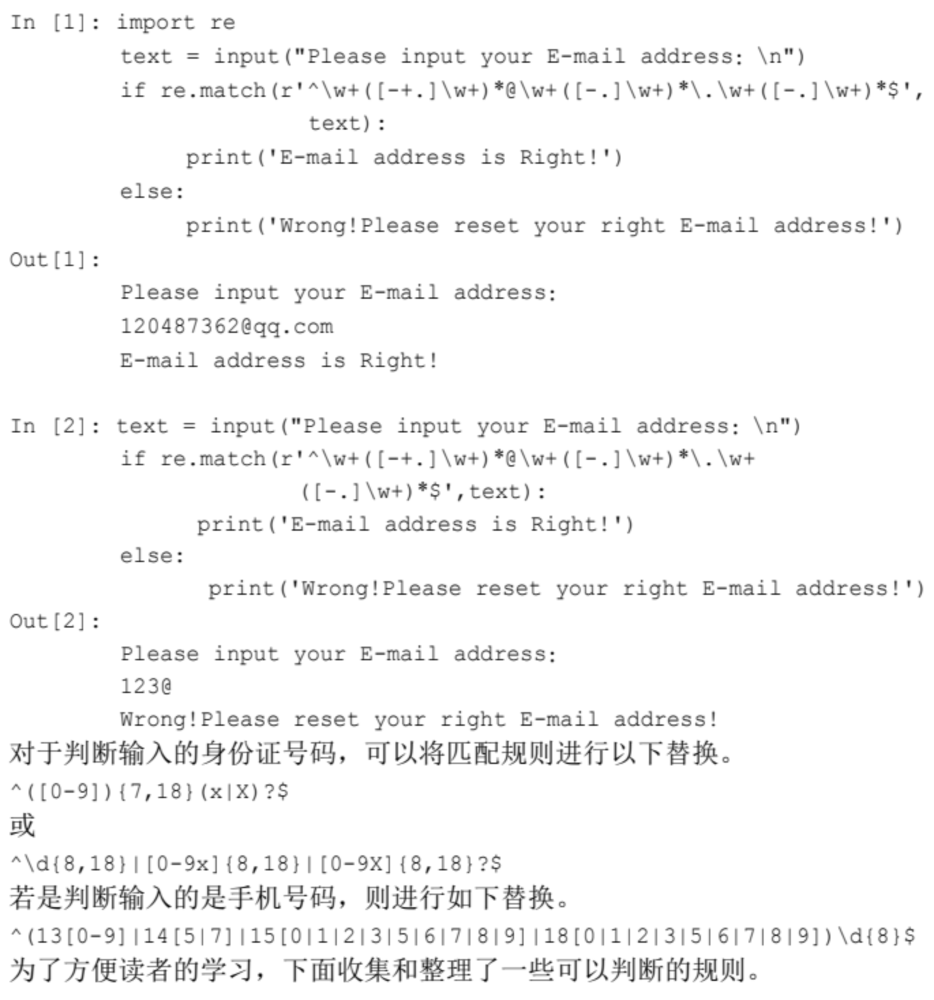

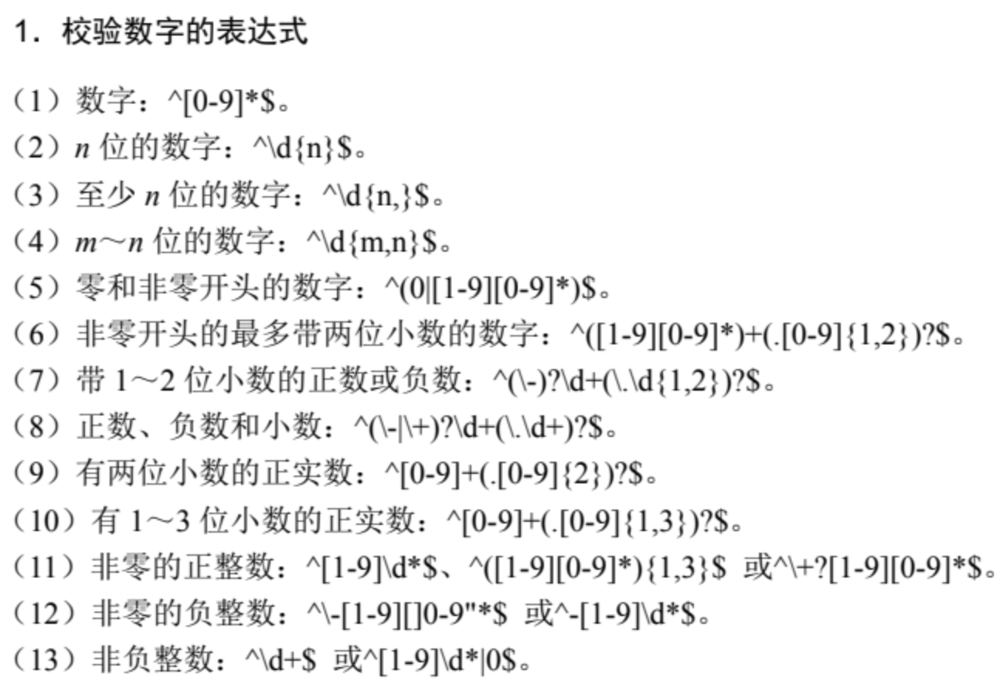

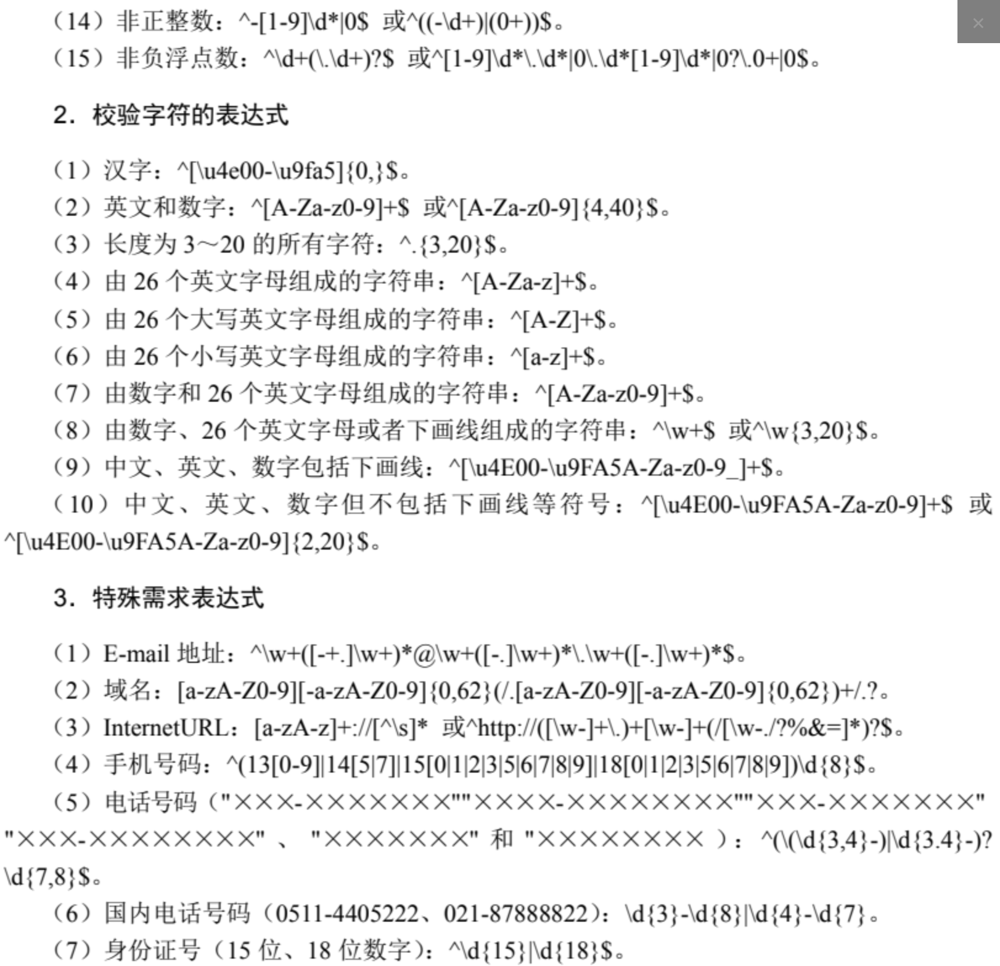

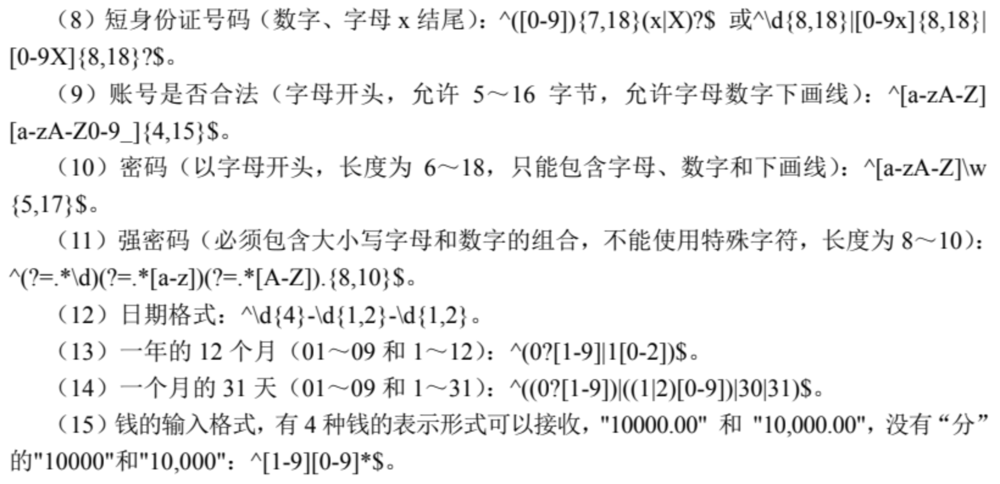

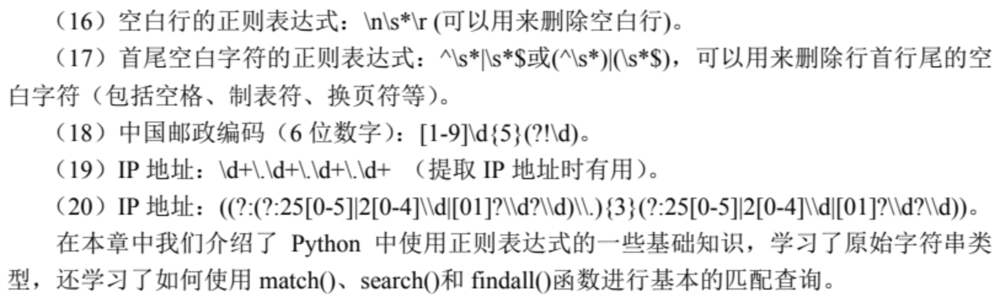